In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.feature_selection import SelectPercentile
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import train_test_split, cross_validate
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score, mean_squared_error, explained_variance_score
from sklearn import linear_model
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import ElasticNet
from sklearn.ensemble import GradientBoostingRegressor

import numpy as np
import time
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing.data import QuantileTransformer
from sklearn import model_selection

import plotly
plotly.offline.init_notebook_mode()

%matplotlib inline
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Data Preparation
First we ingested the Market Check Used Car Inventory data file containing used cars accross United States (~6.7 million instances with 38 features
Then we did initial data wraggling in SQLite and Alteryx (Removed columns with null values, single values, huge descriptive text values. Also instances with null values and 4 digit zipcodes

In [5]:
#df = pd.read_csv(r'C:/Users/Namrata/Desktop/GT/car_data_clean_complete_v4.csv')
df = pd.read_csv('C:/Users/Trypt/Desktop/KBB/DB files/car_data_clean_complete_v4.csv')

In [6]:
df.head()

,id,vin_ss,price_fs,miles_fs,stock_no_ss,year_is,make_ss,model_ss,trim_ss,vehicle_type_ss,...,irs_estimated_population_2015,county full,State short,Per Capita income,Median Household income,Median Family income,Population,Number of households,State full,Regions
0,026454b9-8f7f-4200-8a22-15505442b297,1GNKVLED4CJ261435,16342,71233,P261435,2012,Chevrolet,Traverse,LTZ,SUV,...,5210,Platte County,MO,"$35,143.00","$67,721.00","$83,110.00",90842,36781,Missouri,MidWest
1,03decb32-0fac-45be-b5cb-abfffbbd25e8,JM3TB2CA1C0346156,12500,100215,DT11444A,2012,Mazda,CX-9,Touring,SUV,...,5210,Platte County,MO,"$35,143.00","$67,721.00","$83,110.00",90842,36781,Missouri,MidWest
2,07eaaaba-df00-4440-ad09-438a6ad2ec00,JTHBE5C20C5030562,21990,44637,180770A,2012,Lexus,IS 350,Base,Car,...,5210,Platte County,MO,"$35,143.00","$67,721.00","$83,110.00",90842,36781,Missouri,MidWest
3,09c33c55-0d16-483c-a86f-392cc48cac3e,2C3CCAAGXCH312420,11988,94012,P10436,2012,Chrysler,300,Base,Car,...,5210,Platte County,MO,"$35,143.00","$67,721.00","$83,110.00",90842,36781,Missouri,MidWest
4,09dafb80-659c-41f7-92a1-4933e7dcbb2c,4T4BF1FK3CR169613,13990,86122,762911,2012,Toyota,Camry,L,Car,...,5210,Platte County,MO,"$35,143.00","$67,721.00","$83,110.00",90842,36781,Missouri,MidWest


In [7]:
print(df.shape)

(1673470, 49)


In [8]:
df.isnull().sum()

id                               0
vin_ss                           0
price_fs                         0
miles_fs                         0
stock_no_ss                      0
year_is                          0
make_ss                          0
model_ss                         0
trim_ss                          0
vehicle_type_ss                  0
body_type_ss                     0
drivetrain_ss                    0
engine_ss                        0
engine_size_ss                   0
transmission_ss                  0
doors_is                         0
cylinders_is                     0
interior_color_ss                0
exterior_color_ss                0
dom_is                           0
dom_180_is                       0
msrp_fs                          0
dom_active_is                    0
is_certified_is                  0
fuel_type_ss                     0
scraped_at_dts                   0
status_date_dts                  0
city_ss                          0
state_ss            

In [9]:
df = df.rename(index=str, columns={"vin_ss": "vin", "price_fs": "price", "miles_fs": "miles", "year_is": "year", "make_ss": "make", "model_ss": "model", "trim_ss": "trim", "vehicle_type_ss": "vehicle_type", "body_type_ss": "body_type", "drivetrain_ss": "drivetrain", "engine_ss":"engine", "engine_size_ss": "engine_size", "transmission_ss": "transmission", "doors_is": "doors", "cylinders_is": "cylinders", "interior_color_ss": "interior_color", "exterior_color_ss": "exterior_color", "zip_is": "zip", "dom_is": "dom", "dom_180_is": "dom_180", "msrp_fs": "msrp", "dom_active_is": "dom_active", "is_certified_is": "is_certified", "fuel_type_ss": "fuel_type", "scraped_at_dts": "scraped_at", "status_date_dts": "status_date", "stock_no_ss": "stock_no"})
df = df.drop(columns=['city_ss', 'state_ss'])
df.columns

Index(['id', 'vin', 'price', 'miles', 'stock_no', 'year', 'make', 'model',
       'trim', 'vehicle_type', 'body_type', 'drivetrain', 'engine',
       'engine_size', 'transmission', 'doors', 'cylinders', 'interior_color',
       'exterior_color', 'dom', 'dom_180', 'msrp', 'dom_active',
       'is_certified', 'fuel_type', 'scraped_at', 'status_date', 'AGE', 'zip',
       'type', 'decommissioned', 'primary_city', 'state', 'county', 'timezone',
       'latitude', 'longitude', 'irs_estimated_population_2015', 'county full',
       'State short', 'Per Capita income', 'Median Household income',
       'Median Family income', 'Population', 'Number of households',
       'State full', 'Regions'],
      dtype='object')

In [10]:
df.shape

(1673470, 47)

In [11]:
df['Median Household income num'] = (df['Median Household income'].replace ( '[\$,)]','', regex=True )
                                    .replace( '[(]','-',   regex=True ).astype(float))

In [12]:
df.shape

(1673470, 48)

In [13]:
df["make"].value_counts().sort_values(ascending=False)

Chevrolet        223536
Ford             212925
Toyota           144307
Nissan           125830
Honda            110104
Jeep              94594
Hyundai           70915
BMW               64845
GMC               64358
Lexus             62912
Dodge             57004
Kia               51036
Ram               45052
Mercedes-Benz     42013
Volkswagen        39268
Acura             30778
Subaru            30637
Mazda             30367
Cadillac          29398
Buick             28046
Chrysler          22509
Audi              20607
INFINITI          19198
Lincoln           14161
Land Rover        11309
MINI              10370
Volvo              8875
Porsche            8516
Name: make, dtype: int64

In [14]:
df = df.drop(df[df["make"] == "Panoz"].index | df[df["make"] == "Daewoo"].index | df[df["make"] == "Maybach"].index | df[df["make"] == "AM General"].index | df[df["make"] == "Geo"].index | df[df["make"] == "Fisker"].index | df[df["make"] == "Alfa Romeo"].index | df[df["make"] == "Lotus"].index | df[df["make"] == "McLaren"].index | df[df["make"] == "Plymouth"].index | df[df["make"] == "Isuzu"].index | df[df["make"] == "Oldsmobile"].index | df[df["make"] == "Lamborghini"].index | df[df["make"] == "Rolls-Royce"].index | df[df["make"] == "Aston Martin"].index | df[df["make"] == "Saab"].index | df[df["make"] == "smart"].index | df[df["make"] == "Suzuki"].index | df[df["make"] == "Infiniti"].index | df[df["make"] == "Ferrari"].index | df[df["make"] == "Bentley"].index | df[df["make"] == "Maserati"].index | df[df["make"] == "HUMMER"].index | df[df["make"] == "Mercury"].index | df[df["make"] == "Saturn"].index | df[df["make"] == "FIAT"].index | df[df["make"] == "Pontiac"].index | df[df["make"] == "Jaguar"].index | df[df["make"] == "Scion"].index | df[df["make"] == "Mitsubishi"].index | df[df["make"] == "Porsche"].index | df[df["make"] == "Volvo"].index | df[df["make"] == "MINI"].index | df[df["make"] == "Land Rover"].index | df[df["make"] == "Lincoln"].index | df[df["make"] == "Fiat"].index)
expcars = (df['price'] > 5000) & (df['price'] < 50000)
df = df[expcars]

In [15]:
df.shape

(1569646, 48)

In [16]:
df = df.drop_duplicates(['price', 'miles', 'year', 'make', 'model', 'trim', 
       'engine_size',  'cylinders', 'interior_color', 
       'exterior_color', 'zip', 'msrp', 'is_certified', 'fuel_type', 'state', 
                     'AGE', 'Regions', 'Population', 'Median Household income num'])

In [17]:
df.shape

(1300219, 48)

## Visualizations Begin

In [104]:
statesmean = pd.DataFrame(df.groupby('state').mean())
statesmean = statesmean.reset_index()

#scl = [[0.0, 'rgb(242,240,247)'],[0.2, 'rgb(218,218,235)'],[0.4, 'rgb(188,189,220)'],\
#            [0.6, 'rgb(158,154,200)'],[0.8, 'rgb(117,107,177)'],[1.0, 'rgb(84,39,143)']]
scl = [[0.0, 'rgb(0,255,0)'],[0.2, 'rgb(102,255,0)'],[0.4, 'rgb(204,255,0)'],\
            [0.6, 'rgb(255,204,0)'],[0.8, 'rgb(255,102,0)'],[1.0, 'rgb(255,0,0)']]

def us_map(z, scl, title, colorlabel):
    
    #This chunk allows you to apply labels to states, don't need it at the moment.
    #df['text'] = df['state'] + '<br>' +\
    #    'Beef '+df['beef']+' Dairy '+df['dairy']+'<br>'+\
    #    'Fruits '+df['total fruits']+' Veggies ' + df['total veggies']+'<br>'+\
    #    'Wheat '+df['wheat']+' Corn '+df['corn']
    
    data =[ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = statesmean['state'],
        z = z, 
        locationmode = 'USA-states',
        #text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(0,0,0)',
                width = 2
            ) ),
        colorbar = dict(
            title = colorlabel)
        ) ]
    
    layout = dict(
        title = title,
        #paper_bgcolor='#7f7f7f',
        #plot_bgcolor='#7f7f7f',
        autosize = False,
        width=900,
        height=600,
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = False,
            lakecolor = 'rgb(255, 255, 255)'),
             )
        
    fig = dict( data=data, layout=layout )
    plotly.offline.iplot(fig, filename='d3-cloropleth-map')
    
us_map(statesmean['price'], scl, title="Mean Used Vehicle Prices in the US", colorlabel="USD")

In [128]:
scl = [[0.0, 'rgb(242,240,247)'],[0.2, 'rgb(218,218,235)'],[0.4, 'rgb(188,189,220)'],\
            [0.6, 'rgb(158,154,200)'],[0.8, 'rgb(117,107,177)'],[1.0, 'rgb(84,39,143)']]

us_map(statesmean['AGE'], scl, title="Mean Used Vehicle Age in the US", colorlabel="Years")

In [129]:
scl = [[0.0, 'rgb(0,0,255)'],[0.2, 'rgb(102,0,255)'],[0.4, 'rgb(204,0,255)'],\
            [0.6, 'rgb(255,0,204)'],[0.8, 'rgb(255,0,102)'],[1.0, 'rgb(255,0,0)']]

us_map(statesmean['miles'], scl, title="Mean Used Vehicle Mileage in the US", colorlabel="Miles")

In [100]:
statemake = pd.DataFrame(df.groupby(['State full', 'make']).mean())
statemake = statemake.reset_index()

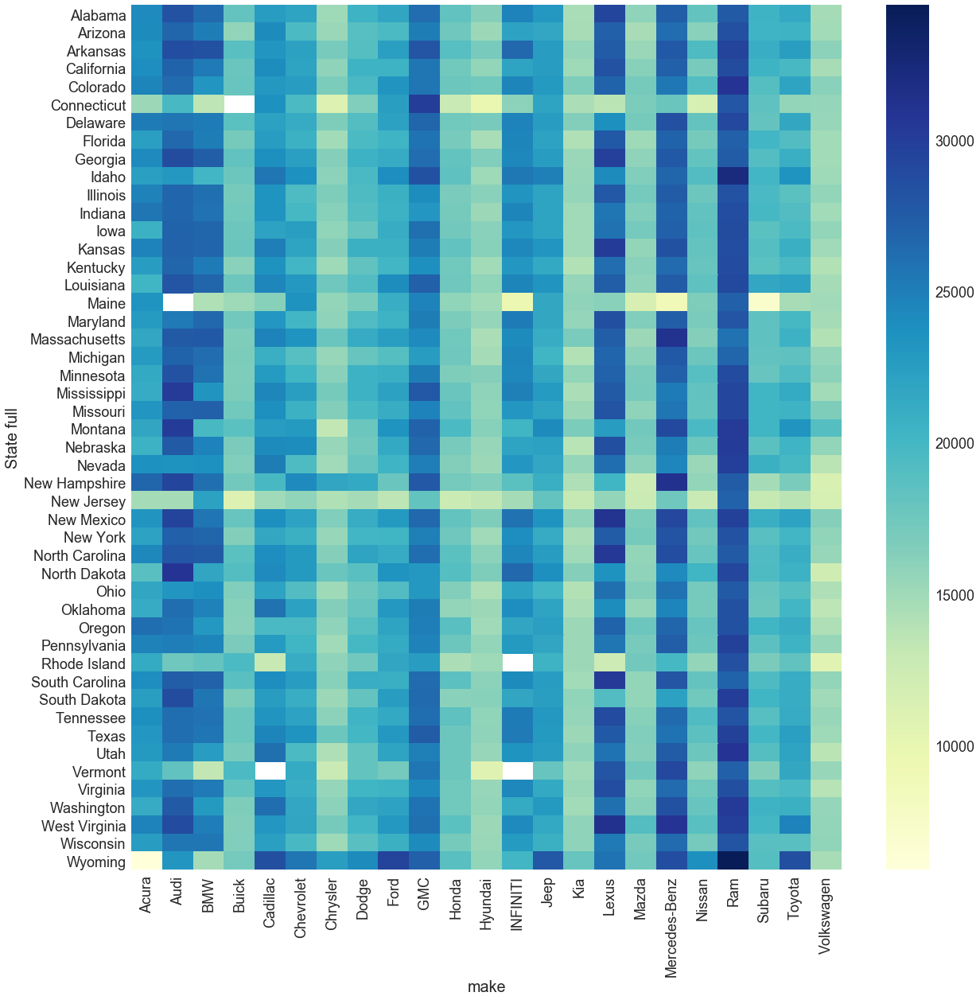

In [106]:
sns.set(style="whitegrid", font_scale=1.8)
f, ax = plt.subplots(figsize=(20, 20))
heaty = statemake.pivot("State full", "make", "price")
sns.heatmap(heaty, cmap="YlGnBu")

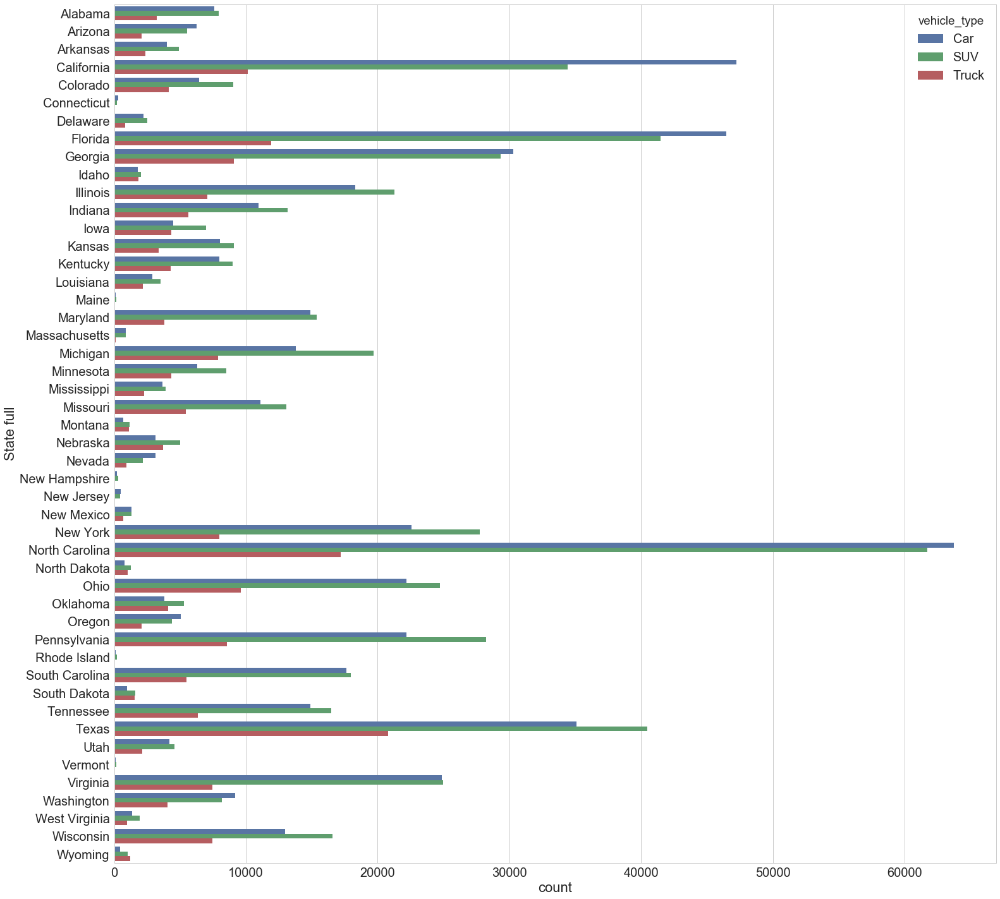

In [122]:
sns.set(style="whitegrid", font_scale=2)
f, ax = plt.subplots(figsize=(25, 25))
vehiclecount = df.sort_values('State full', ascending=True, inplace=False)
vehiclecount = vehiclecount.drop(vehiclecount[vehiclecount["vehicle_type"] == "Multipurpose Passenger Vehicle (Mpv)"].index | vehiclecount[vehiclecount["vehicle_type"] == "Van"].index)
sns.countplot(y="State full", hue="vehicle_type", data=vehiclecount)

C:\Users\Trypt\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



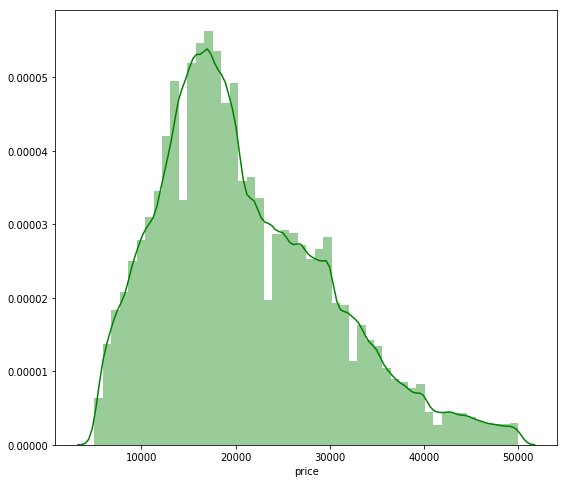

In [19]:
# so  now the car price distribution looks more even
plt.figure(figsize=(9, 8))
sns.distplot(df['price'], color='g', bins=50)

Most Popular used car makes are Chevrolet and Ford

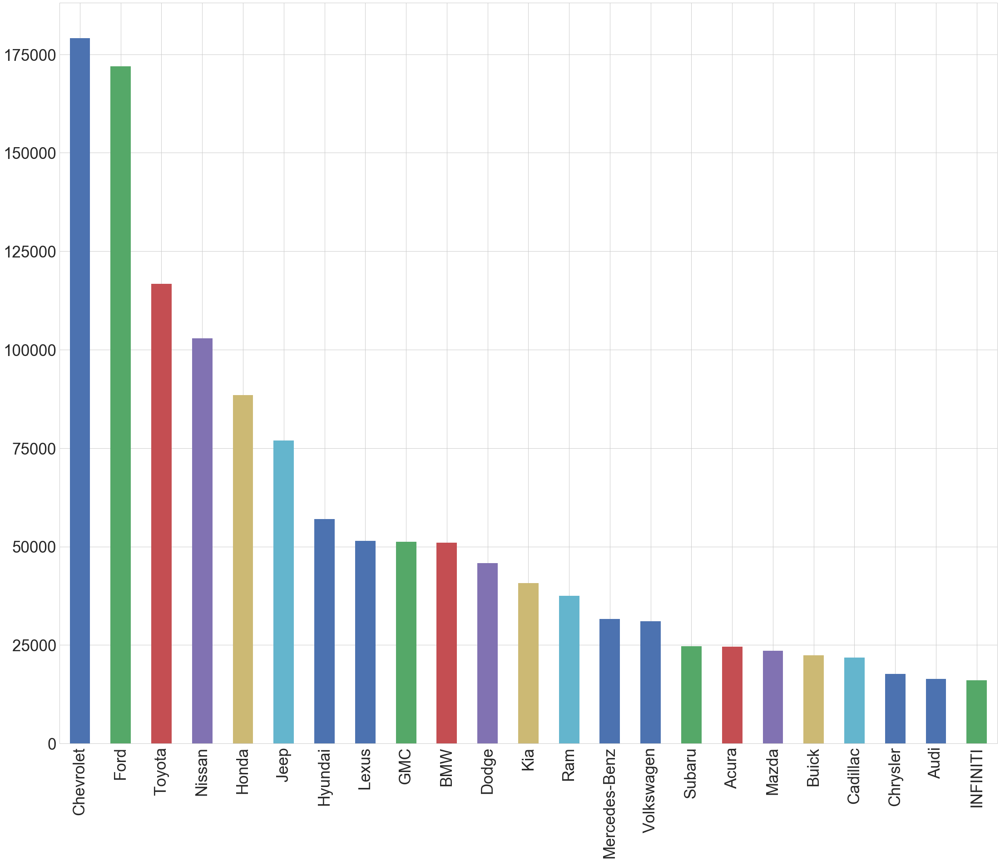

In [137]:
sns.set(style="whitegrid", font_scale=3.5)
df['make'].value_counts().plot(kind='bar', figsize=(37,30))

Newer cars are more expensive than older cars. Expected.

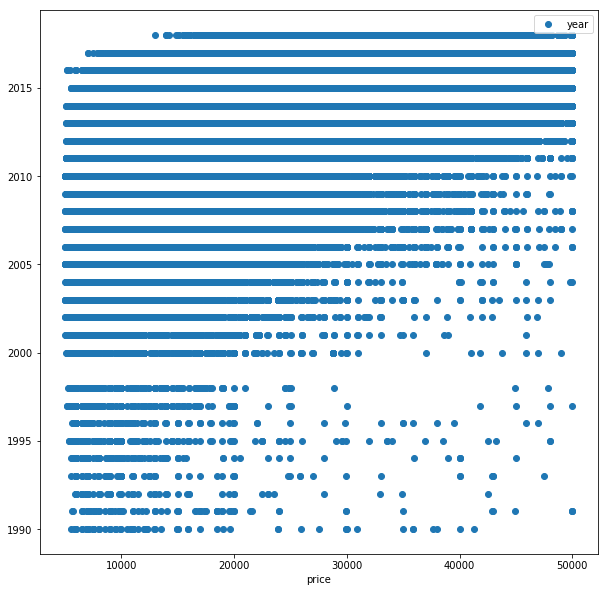

In [21]:
df.plot(x='price', y='year', style='o', figsize=(10,10))

Range and median prices per car type

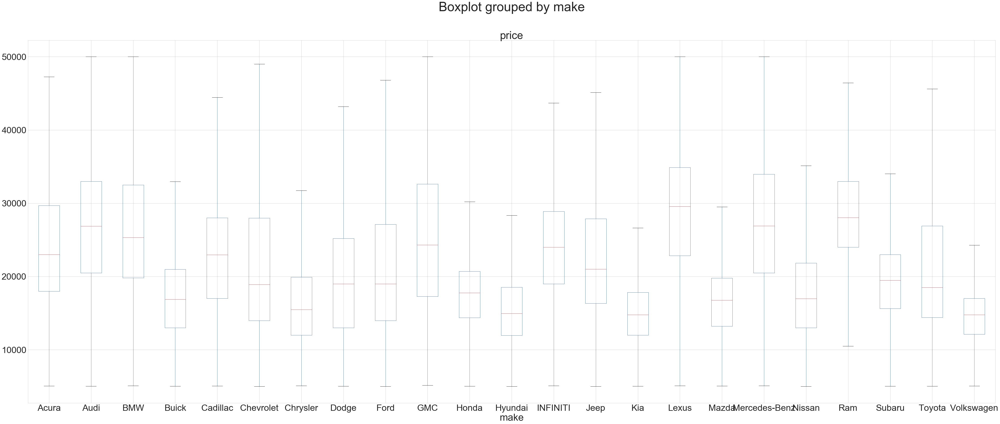

In [143]:
sns.set(style="whitegrid", font_scale=4)
df.boxplot(column="price", by="make", figsize=(75,30), showfliers=False)

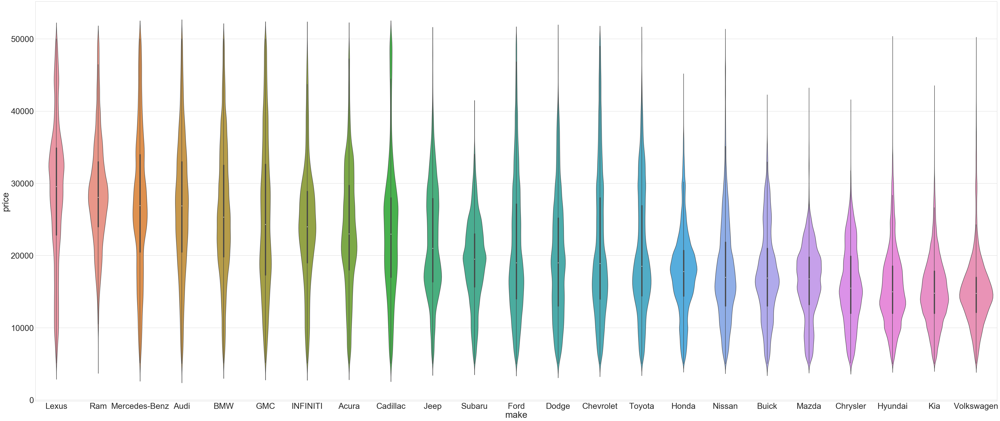

In [173]:
from matplotlib import pyplot
sns.set(style="whitegrid", font_scale=3.6)
fig, ax = pyplot.subplots(figsize=(75,32))
sns.violinplot(x="make", y="price", data=df, ax=ax, order=["Lexus", "Ram", "Mercedes-Benz", "Audi", "BMW", "GMC", "INFINITI", "Acura", "Cadillac", "Jeep", "Subaru", "Ford", "Dodge", "Chevrolet", "Toyota", "Honda", "Nissan", "Buick", "Mazda", "Chrysler", "Hyundai", "Kia", "Volkswagen"])

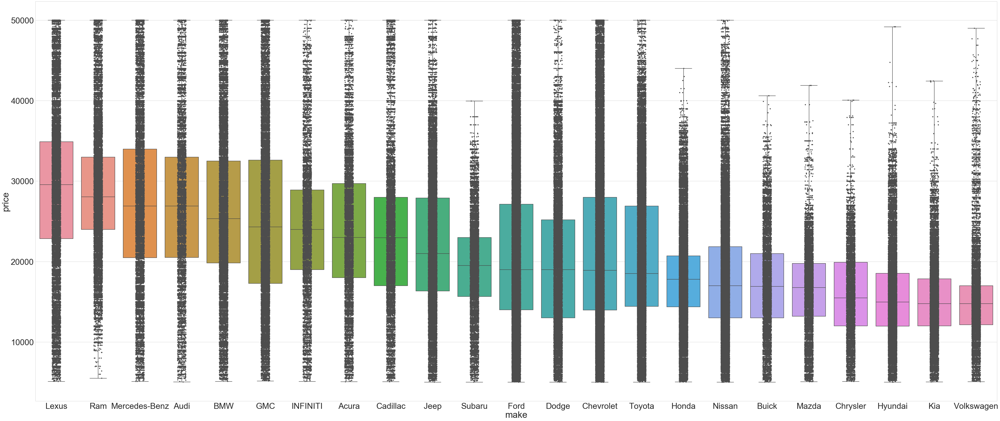

In [175]:
sns.set(style="whitegrid", font_scale=3.6)
fig, size = pyplot.subplots(figsize=(75,32))
ax = sns.boxplot(x="make", y="price", data=df, whis=np.inf, ax=size, order=["Lexus", "Ram", "Mercedes-Benz", "Audi", "BMW", "GMC", "INFINITI", "Acura", "Cadillac", "Jeep", "Subaru", "Ford", "Dodge", "Chevrolet", "Toyota", "Honda", "Nissan", "Buick", "Mazda", "Chrysler", "Hyundai", "Kia", "Volkswagen"])
ax = sns.stripplot(x="make", y="price", data=df, jitter=True, color=".3", ax=size, order=["Lexus", "Ram", "Mercedes-Benz", "Audi", "BMW", "GMC", "INFINITI", "Acura", "Cadillac", "Jeep", "Subaru", "Ford", "Dodge", "Chevrolet", "Toyota", "Honda", "Nissan", "Buick", "Mazda", "Chrysler", "Hyundai", "Kia", "Volkswagen"])

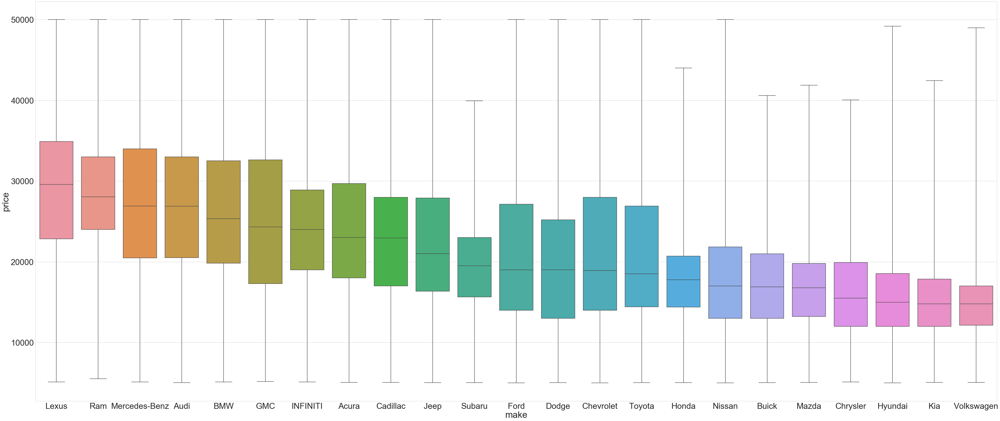

In [172]:
sns.set(style="whitegrid", font_scale=3.6)
fig, ax = pyplot.subplots(figsize=(75,32))
sns.boxplot(x="make", y="price", data=df, ax=ax, whis=np.inf, order=["Lexus", "Ram", "Mercedes-Benz", "Audi", "BMW", "GMC", "INFINITI", "Acura", "Cadillac", "Jeep", "Subaru", "Ford", "Dodge", "Chevrolet", "Toyota", "Honda", "Nissan", "Buick", "Mazda", "Chrysler", "Hyundai", "Kia", "Volkswagen"])

In [171]:
makeorder = pd.DataFrame(df.groupby('make').median())
makeorder = makeorder.reset_index()
makeorder.sort_values(by="price", ascending=False)

,make,price,miles,year,engine_size,doors,cylinders,dom,dom_180,msrp,...,zip_feat,fuel_type_feat,State short_feat,Regions_feat,stock_no_feat,vehicle_type_feat,body_type_feat,drivetrain_feat,engine_feat,transmission_feat
15,Lexus,29567.000,34989.000,2015.000,3.500,4.000,6.000,41.000,29.000,29915.500,...,1878.000,5.000,24.000,2.000,387000.000,0.000,5.000,4.000,205.000,2.000
19,Ram,28049.000,43071.000,2015.000,5.700,4.000,8.000,73.000,35.000,28907.000,...,3433.000,2.000,24.000,2.000,278965.000,2.000,4.000,1.000,352.000,2.000
17,Mercedes-Benz,26915.000,39585.500,2015.000,3.000,4.000,6.000,48.000,31.000,26999.000,...,2102.000,5.000,19.000,2.000,329355.500,0.000,6.000,4.000,169.000,2.000
1,Audi,26888.000,41607.000,2015.000,2.000,4.000,4.000,52.000,32.000,26995.000,...,2972.000,5.000,23.000,2.000,264184.000,0.000,5.000,3.000,64.000,2.000
2,BMW,25331.000,39701.000,2015.000,3.000,4.000,6.000,49.000,31.000,25850.000,...,2045.000,5.000,24.000,2.000,267436.000,0.000,6.000,6.000,153.000,2.000
9,GMC,24305.000,60010.000,2015.000,5.300,4.000,8.000,58.000,34.000,24860.000,...,3322.000,6.000,24.000,2.000,278659.000,1.000,5.000,3.000,327.000,2.000
12,INFINITI,23997.000,44758.000,2015.000,3.700,4.000,6.000,50.000,31.000,24635.000,...,2208.000,5.000,24.000,2.000,336025.000,1.000,5.000,3.000,235.000,2.000
0,Acura,22999.000,37389.000,2015.000,3.500,4.000,6.000,39.000,27.000,23499.000,...,1840.000,5.000,24.000,2.000,237944.000,1.000,5.000,4.000,215.000,2.000
4,Cadillac,22954.000,49329.000,2014.000,3.600,4.000,6.000,63.000,36.000,23252.500,...,2911.000,6.000,23.000,2.000,265722.000,0.000,5.000,4.000,223.000,2.000
13,Jeep,21000.000,44348.000,2015.000,3.600,4.000,6.000,63.000,35.000,21900.000,...,2727.000,6.000,24.000,2.000,286131.000,1.000,5.000,1.000,221.000,2.000


# Feature Engineering

Converting categorical features into numeric values using Scikit Learn

In [23]:
labels = ['make', 'model', 'trim', 'interior_color', 'exterior_color', 'zip', 'fuel_type', 
          'State short', 'Regions','stock_no', 'vehicle_type', 'body_type', 'drivetrain', 'engine', 'transmission']
les = {}

for l in labels:
    les[l] = LabelEncoder()
    les[l].fit(df[l].astype(str))
    tr = les[l].transform(df[l].astype(str))
    
    df.loc[:, l + '_feat'] = pd.Series(tr, index=df.index)

labeled = df[['price'
                        ,'miles'
                        ,'year'
                        ,'cylinders'
                        ,'msrp'
                        , 'is_certified'
                        , 'engine_size'
                        ,'AGE', 'Population', 'doors', 'dom', 'dom_180', 'dom_active', 
                         'Median Household income num'] 
                    + [x+"_feat" for x in labels]]

In [24]:
print(labeled.head())

   price   miles  year  cylinders   msrp  is_certified  engine_size  AGE  \
0  16342   71233  2012          6  16342             0        3.600    7   
1  12500  100215  2012          6  12500             0        3.700    7   
2  21990   44637  2012          6  21990             1        3.500    7   
3  11988   94012  2012          6  11988             0        3.600    7   
4  13990   86122  2012          4  13990             0        2.500    7   

   Population  doors        ...          zip_feat  fuel_type_feat  \
0       90842      4        ...              4608               6   
1       90842      4        ...              4608               6   
2       90842      4        ...              4608               5   
3       90842      4        ...              4608               2   
4       90842      4        ...              4608               6   

   State short_feat  Regions_feat  stock_no_feat  vehicle_type_feat  \
0                21             0         434710         

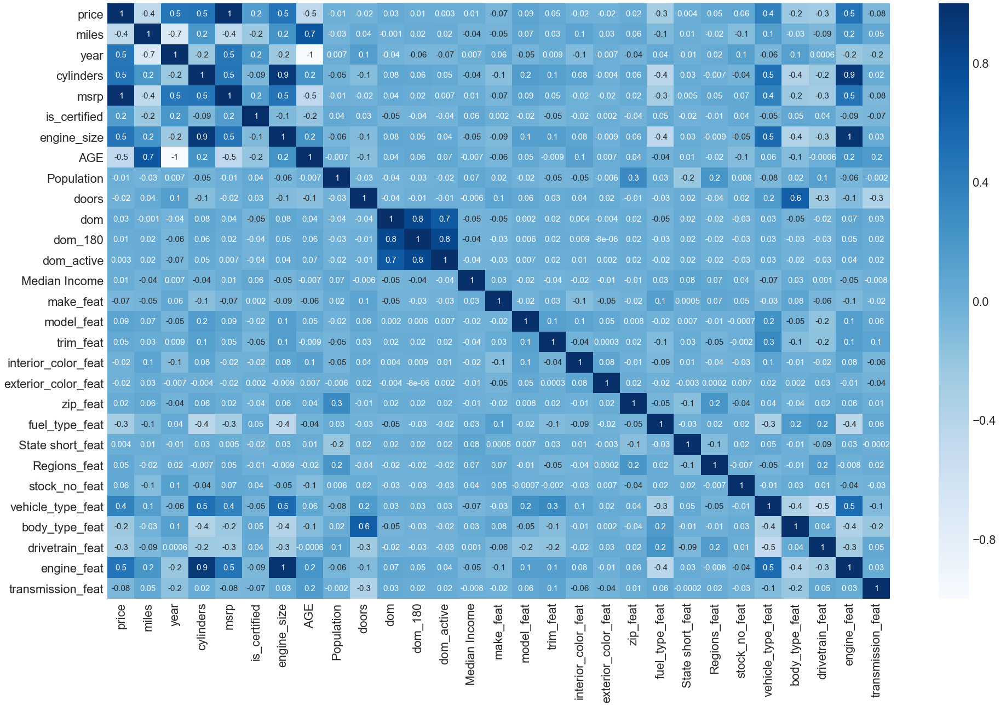

In [188]:
labeled = labeled.rename(index=str, columns={"Median Household income num": "Median Income"})
corr = labeled.corr(method='pearson')
sns.set(font_scale=2.2)
f, ax = plt.subplots(figsize=(32, 20))
sns.heatmap(corr, annot = True, fmt =".1g", annot_kws={"size": 15}, cmap = "Blues")
labeled = labeled.rename(index=str, columns={"Median Income": "Median Household income num"})

In [26]:
labeled.corr().loc[:,'price'].abs().sort_values(ascending=False)[1:]

msrp                          0.990
engine_size                   0.475
engine_feat                   0.474
cylinders                     0.473
AGE                           0.453
year                          0.453
miles                         0.448
vehicle_type_feat             0.371
fuel_type_feat                0.286
drivetrain_feat               0.262
body_type_feat                0.240
is_certified                  0.163
model_feat                    0.094
transmission_feat             0.082
make_feat                     0.067
stock_no_feat                 0.064
Regions_feat                  0.052
trim_feat                     0.046
dom                           0.034
doors                         0.024
exterior_color_feat           0.021
interior_color_feat           0.019
zip_feat                      0.019
Population                    0.015
dom_180                       0.014
Median Household income num   0.012
State short_feat              0.004
dom_active                  

# Model Selection 
Used 25 most influencing features to predict price (80/20 train test split)
Dropped msrp_fs because of 1:1 corelation with price_fs; dropped year_is as it is duplicate with AGE; dropped engine_feat similar to engine

# Model 1 Linear Regression 

In [27]:
y = labeled.price

In [28]:
print (labeled.columns.tolist())

['price', 'miles', 'year', 'cylinders', 'msrp', 'is_certified', 'engine_size', 'AGE', 'Population', 'doors', 'dom', 'dom_180', 'dom_active', 'Median Household income num', 'make_feat', 'model_feat', 'trim_feat', 'interior_color_feat', 'exterior_color_feat', 'zip_feat', 'fuel_type_feat', 'State short_feat', 'Regions_feat', 'stock_no_feat', 'vehicle_type_feat', 'body_type_feat', 'drivetrain_feat', 'engine_feat', 'transmission_feat']


In [29]:
X = labeled[['miles', 'cylinders', 'is_certified', 'engine_size', 'AGE', 'Population', 'doors', 
             'dom', 'dom_180', 'dom_active', 'Median Household income num', 'make_feat', 'model_feat', 'trim_feat', 
             'interior_color_feat', 'exterior_color_feat', 'zip_feat', 'fuel_type_feat', 'State short_feat', 
             'Regions_feat', 'stock_no_feat', 'vehicle_type_feat', 'body_type_feat', 'drivetrain_feat', 
              'transmission_feat']]

In [30]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [31]:
reg = LinearRegression()

In [32]:
reg.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [33]:
y_pred = reg.predict(X_test)

In [34]:
r2= r2_score(y_pred, y_test)
print(r2)

0.5157442205286966


In [35]:
mean_squared_error(y_pred, y_test)

26949053.60841656

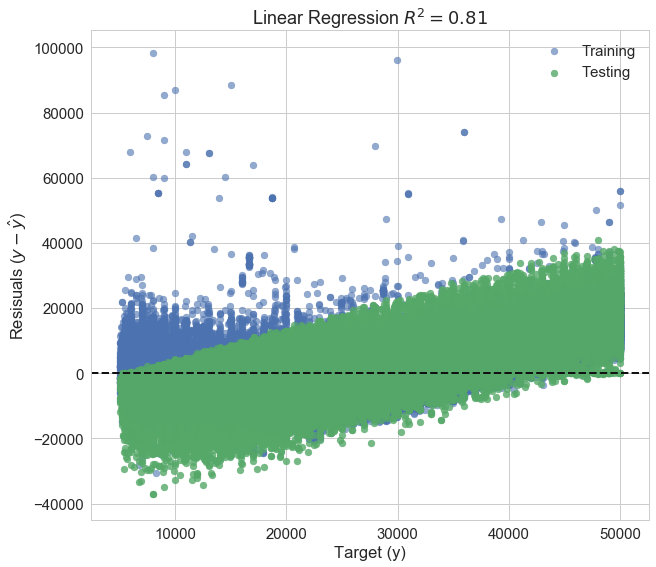

In [126]:
#Compute Residuals
test_residuals = y_test - y_pred
train_residuals = y_train - reg.predict(X_train)

#Draw residuals
sns.set(style="whitegrid", font_scale=1.5)
fig, ax = plt.subplots(figsize= (10,9))
ax.scatter(y_train, train_residuals, label="Training", alpha=0.6)
ax.scatter(y_test, test_residuals, label="Testing", alpha=0.8)

#Make plot pretty
ax.set_title("Linear Regression $R^2={:0.2f}$".format(r2))
ax.legend(loc='best')
ax.set_ylabel("Resisuals ($y-\hat{y}$)")
ax.set_xlabel("Target (y)")

#Draw zero line
ax.axhline(0, c='k', ls='--', lw=2)

In [37]:
from sklearn import cross_validation
cv = cross_validation.KFold(len(y_pred), n_folds=12,  random_state=30)

C:\Users\Trypt\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning:

This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.



In [38]:
print(cv)

sklearn.cross_validation.KFold(n=260044, n_folds=12, shuffle=False, random_state=30)


In [39]:
from yellowbrick.model_selection import CVScores
from sklearn.model_selection import StratifiedKFold

C:\Users\Trypt\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:605: Warning:

The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=12.



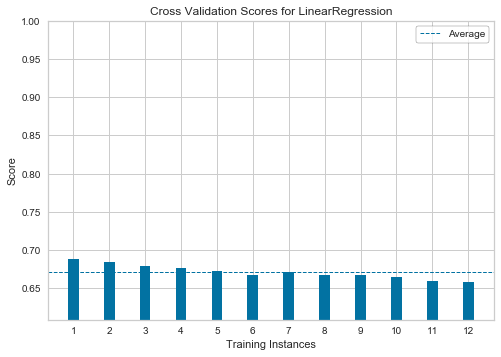

In [40]:
# Create a new figure and axes
_, ax = plt.subplots()

# Create a cross-validation strategy
cv = StratifiedKFold(12)

# Create the cv score visualizer
oz = CVScores(
    LinearRegression(), ax=ax, cv=cv, scoring='r2'
)

oz.fit(X, y)
oz.poof()

# Model 2 - Decision Tree (Random Forest Regressor)

In [41]:
rf = RandomForestRegressor()

In [42]:
rf.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [43]:
y_pred = rf.predict(X_test)

In [44]:
r2 = r2_score(y_pred, y_test)
print(r2)

0.9709030790691375


In [45]:
mean_squared_error(y_pred, y_test)

2327005.6087574414

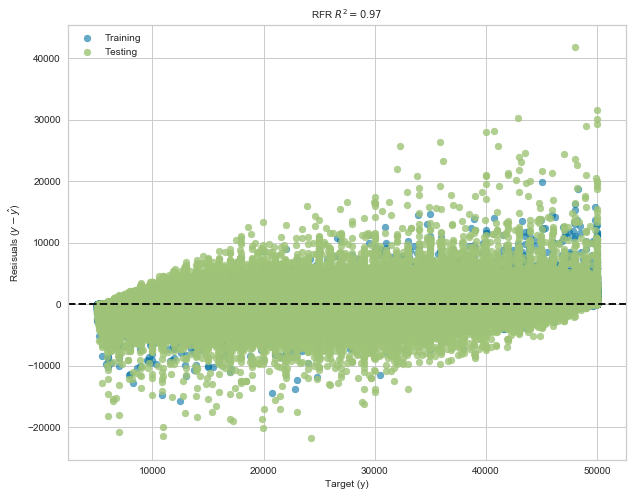

In [46]:
#Compute Residuals
test_residuals = y_test - y_pred
train_residuals = y_train - rf.predict(X_train)

#Draw residuals
fig, ax = plt.subplots(figsize= (10,8))
ax.scatter(y_train, train_residuals, label="Training", alpha=0.6)
ax.scatter(y_test, test_residuals, label="Testing", alpha=0.8)

#Make plot pretty
ax.set_title("RFR $R^2={:0.2f}$".format(r2), fontsize=10)
ax.legend(loc='best', fontsize=10)
ax.set_ylabel("Resisuals ($y-\hat{y}$)", fontsize=10)
ax.set_xlabel("Target (y)", fontsize=10)

#Draw zero line
ax.axhline(0, c='k', ls='--', lw=2)

(array([5.70000e+01, 7.70000e+01, 1.30000e+02, 1.51000e+02, 2.52000e+02,
        3.62000e+02, 5.35000e+02, 8.42000e+02, 1.35300e+03, 2.15400e+03,
        3.62500e+03, 5.94800e+03, 1.05910e+04, 2.02360e+04, 5.45320e+04,
        1.06418e+05, 2.38870e+04, 1.24420e+04, 6.91300e+03, 3.73800e+03,
        2.19500e+03, 1.23600e+03, 7.54000e+02, 4.53000e+02, 2.86000e+02,
        1.96000e+02, 1.08000e+02, 6.60000e+01, 5.80000e+01, 4.40000e+01]),
 array([-9.98700000e+03, -9.32141333e+03, -8.65582667e+03, -7.99024000e+03,
        -7.32465333e+03, -6.65906667e+03, -5.99348000e+03, -5.32789333e+03,
        -4.66230667e+03, -3.99672000e+03, -3.33113333e+03, -2.66554667e+03,
        -1.99996000e+03, -1.33437333e+03, -6.68786667e+02, -3.20000000e+00,
         6.62386667e+02,  1.32797333e+03,  1.99356000e+03,  2.65914667e+03,
         3.32473333e+03,  3.99032000e+03,  4.65590667e+03,  5.32149333e+03,
         5.98708000e+03,  6.65266667e+03,  7.31825333e+03,  7.98384000e+03,
         8.64942667e+03,  9.

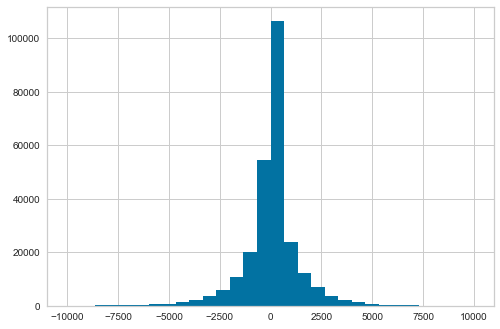

In [47]:
subsetted_data_pred = y_pred[y_test < 60000]
subsetted_data_test = y_test[y_test < 60000]

differences = subsetted_data_pred - subsetted_data_test
d = differences[(differences < 10000) & (differences > -10000)]

plt.hist(d,bins=30)

In [48]:
d.mean(), d.std()

(28.802438252872847, 1417.7897454235379)

C:\Users\Trypt\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:605: Warning:

The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=12.



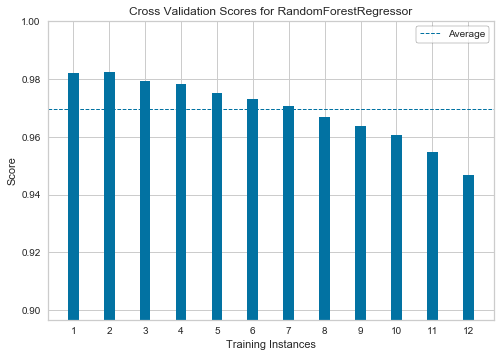

In [49]:
# Create a new figure and axes
_, ax = plt.subplots()

# Create a cross-validation strategy
cv = StratifiedKFold(12)

# Create the cv score visualizer
oz = CVScores(
    RandomForestRegressor(), ax=ax, cv=cv, scoring='r2'
)

oz.fit(X, y)
oz.poof()

# Model 3 - Decision Tree Gradient Boost

In [50]:
gbr = GradientBoostingRegressor()

In [51]:
gbr.fit(X_train, y_train)

GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
             learning_rate=0.1, loss='ls', max_depth=3, max_features=None,
             max_leaf_nodes=None, min_impurity_decrease=0.0,
             min_impurity_split=None, min_samples_leaf=1,
             min_samples_split=2, min_weight_fraction_leaf=0.0,
             n_estimators=100, presort='auto', random_state=None,
             subsample=1.0, verbose=0, warm_start=False)

In [52]:
y_pred = gbr.predict(X_test)

In [53]:
r2 = r2_score(y_pred, y_test)
print(r2)

0.8125462074933141


In [54]:
mean_squared_error(y_pred, y_test)

11908696.528868891

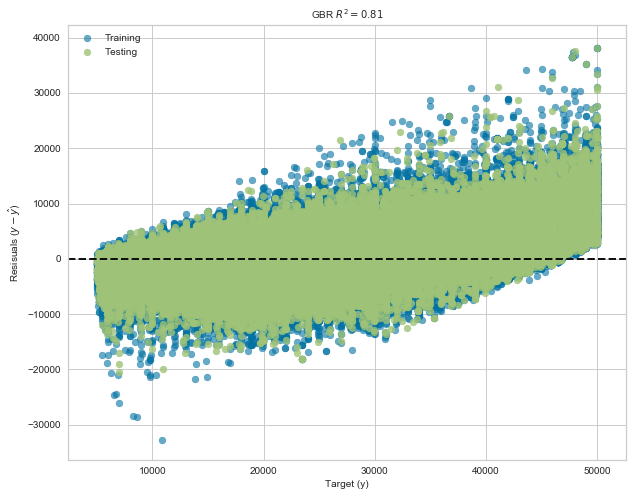

In [55]:
#Compute Residuals
test_residuals = y_test - y_pred
train_residuals = y_train - gbr.predict(X_train)

#Draw residuals
fig, ax = plt.subplots(figsize= (10,8))
ax.scatter(y_train, train_residuals, label="Training", alpha=0.6)
ax.scatter(y_test, test_residuals, label="Testing", alpha=0.8)

#Make plot pretty
ax.set_title("GBR $R^2={:0.2f}$".format(r2), fontsize=10)
ax.legend(loc='best', fontsize=10)
ax.set_ylabel("Resisuals ($y-\hat{y}$)", fontsize=10)
ax.set_xlabel("Target (y)", fontsize=10)

#Draw zero line
ax.axhline(0, c='k', ls='--', lw=2)

(array([  771.,  1076.,  1314.,  1617.,  1957.,  2833.,  3482.,  4503.,
         5850.,  8017., 10342., 13654., 17087., 21092., 24399., 26082.,
        24904., 21877., 17714., 13754., 10182.,  7405.,  5304.,  3737.,
         2436.,  1758.,  1333.,   881.,   524.,   333.]),
 array([-9.99491069e+03, -9.32843210e+03, -8.66195350e+03, -7.99547490e+03,
        -7.32899631e+03, -6.66251771e+03, -5.99603912e+03, -5.32956052e+03,
        -4.66308192e+03, -3.99660333e+03, -3.33012473e+03, -2.66364613e+03,
        -1.99716754e+03, -1.33068894e+03, -6.64210344e+02,  2.26825183e+00,
         6.68746848e+02,  1.33522544e+03,  2.00170404e+03,  2.66818264e+03,
         3.33466123e+03,  4.00113983e+03,  4.66761843e+03,  5.33409702e+03,
         6.00057562e+03,  6.66705422e+03,  7.33353281e+03,  8.00001141e+03,
         8.66649000e+03,  9.33296860e+03,  9.99944720e+03]),
 <a list of 30 Patch objects>)

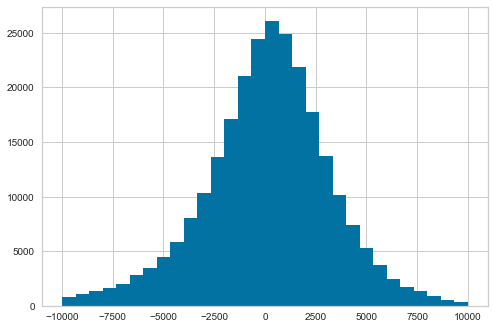

In [56]:
subsetted_data_pred = y_pred[y_test < 60000]
subsetted_data_test = y_test[y_test < 60000]

differences = subsetted_data_pred - subsetted_data_test
d = differences[(differences < 10000) & (differences > -10000)]

plt.hist(d,bins=30)

In [57]:
d.mean(), d.std()

(131.48225516094976, 3096.8171444262466)

C:\Users\Trypt\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:605: Warning:

The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=12.



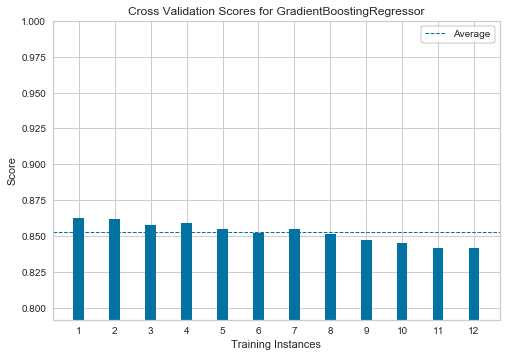

In [58]:
# Create a new figure and axes
_, ax = plt.subplots()

# Create a cross-validation strategy
cv = StratifiedKFold(12)

# Create the cv score visualizer
oz = CVScores(
    GradientBoostingRegressor(), ax=ax, cv=cv, scoring='r2'
)

oz.fit(X, y)
oz.poof()

RFR
CV accuracy: 0.97117 +/- 0.00055
--- 1661.8634889125824 seconds ---
LR
CV accuracy: 0.66432 +/- 0.00217
--- 102.45070338249207 seconds ---
GBR
CV accuracy: 0.85478 +/- 0.00128
--- 3243.3780376911163 seconds ---


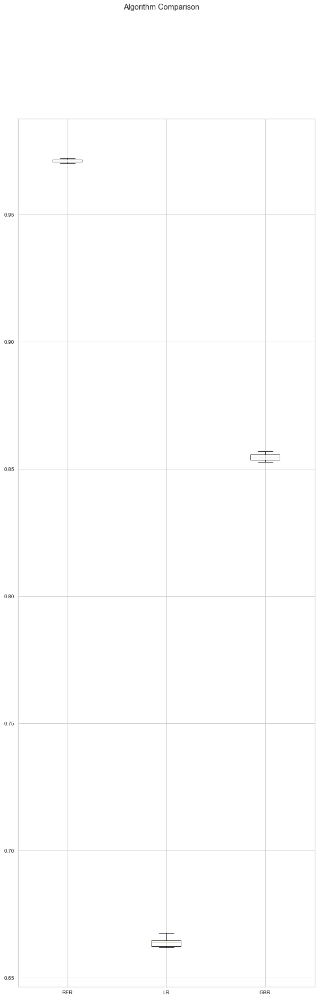

In [59]:
# Comparing Algorithms

models = []
models.append(('RFR', RandomForestRegressor()))
models.append(('LR', LinearRegression()))
models.append(('GBR', GradientBoostingRegressor()))

scoring = 'r2'

results = []
names = []

from sklearn.model_selection import cross_val_score
res_scores = []
m_names = []
for name, model in models:
    start_time = time.time()
    print(name)
    pipe_mdl = make_pipeline(QuantileTransformer(),
                        model)
    kfold = model_selection.KFold(n_splits=12, random_state=7)
    scores = model_selection.cross_val_score(estimator=pipe_mdl,
                         X=X_train,
                         y=y_train,
                         cv=kfold,
                         #n_jobs=-1,
                         scoring = scoring)
    print('CV accuracy: %.5f +/- %.5f' % (np.mean(scores),np.std(scores)))
    res_scores.append(scores)
    m_names.append(name)
    print('--- %s seconds ---' % (time.time() - start_time))

fig = plt.figure(figsize=(10, 30))
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(res_scores)
ax.set_xticklabels(m_names)
plt.show()

# Model 4 - LASSO (L1 Regularization)
LASSO forces weak features to have zeroes as coefficients, effectively dropping the least predictive features

In [60]:
clf_lasso = linear_model.Lasso(alpha=0.5)

In [61]:
clf_lasso.fit(X_train, y_train)

Lasso(alpha=0.5, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)

In [62]:
y_pred = clf_lasso.predict(X_test)

In [63]:
print(list(zip(X, clf_lasso.coef_.tolist())))

[('miles', -0.07777528140155922), ('cylinders', 1292.965305922599), ('is_certified', 2045.6163256431346), ('engine_size', 2326.055659142173), ('AGE', -1134.46900789078), ('Population', 2.013716980650218e-06), ('doors', -17.51176730703081), ('dom', -1.4335874600693623), ('dom_180', 2.1365696583039138), ('dom_active', -0.008504235822678523), ('Median Household income num', 0.014624404306373061), ('make_feat', -66.81387013026385), ('model_feat', 1.2192683860339542), ('trim_feat', -1.8628960961158278), ('interior_color_feat', -0.030669399481770658), ('exterior_color_feat', -0.019930281033834468), ('zip_feat', 0.015688540335141415), ('fuel_type_feat', -231.30107241605052), ('State short_feat', -5.173762088618609), ('Regions_feat', 561.1813951301738), ('stock_no_feat', 0.00028913514198768836), ('vehicle_type_feat', 1014.5449955026777), ('body_type_feat', -518.8737955794971), ('drivetrain_feat', -702.8033656612024), ('transmission_feat', -54.26891404032853)]


In [64]:
r2_score(y_pred, y_test)

0.5156564347075439

In [65]:
mean_squared_error(y_pred, y_test)

26949074.918054156

# Model 5 - Ridge Regression (L2 Regularization)
Ridge assigns every feature a weight, but spreads the coefficient values out more equally, shrinking but still maintaining less predictive features.

In [66]:
clf = linear_model.Ridge(alpha=0.5)

In [67]:
clf.fit(X_train, y_train)

Ridge(alpha=0.5, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=False, random_state=None, solver='auto', tol=0.001)

In [68]:
y_pred = clf.predict(X_test)

In [69]:
print(list(zip(X, clf.coef_.tolist())))

[('miles', -0.07775810667889595), ('cylinders', 1292.9026467745723), ('is_certified', 2050.244635378274), ('engine_size', 2325.9101349339826), ('AGE', -1134.6233690218187), ('Population', 1.957560948770719e-06), ('doors', -22.951789129552978), ('dom', -1.433589446894907), ('dom_180', 2.137063855173207), ('dom_active', -0.008462802298365555), ('Median Household income num', 0.014619474812669073), ('make_feat', -66.81249557269173), ('model_feat', 1.2184965673024617), ('trim_feat', -1.8631927736476557), ('interior_color_feat', -0.030673894706814094), ('exterior_color_feat', -0.019930798303219727), ('zip_feat', 0.01565092402990808), ('fuel_type_feat', -231.3869745930639), ('State short_feat', -5.172915356134083), ('Regions_feat', 561.8077092073249), ('stock_no_feat', 0.00028910559825410566), ('vehicle_type_feat', 1016.8516167812437), ('body_type_feat', -517.4687849461124), ('drivetrain_feat', -703.0804034462643), ('transmission_feat', -54.7395842346645)]


In [70]:
r2_score(y_pred, y_test)

0.5157440961561741

In [71]:
mean_squared_error(y_pred, y_test)

26949053.673918173

# Model 6 - Elastic Net
ElasticNet is a linear combination of L1 and L2 regularization, meaning it combines Ridge and LASSO and essentially splits the difference.

In [72]:
enr = linear_model.ElasticNet()

In [73]:
enr.fit(X_train, y_train)

ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
      max_iter=1000, normalize=False, positive=False, precompute=False,
      random_state=None, selection='cyclic', tol=0.0001, warm_start=False)

In [74]:
y_pred = enr.predict(X_test)

In [75]:
print(list(zip(X, enr.coef_.tolist())))

[('miles', -0.08472543551113151), ('cylinders', 1508.8189800659402), ('is_certified', 359.48360657329556), ('engine_size', 1567.281153750187), ('AGE', -986.9147744069899), ('Population', -5.117356939410081e-06), ('doors', 0.6708267306680666), ('dom', -1.1986735733605798), ('dom_180', 1.9673676263840898), ('dom_active', -0.2903253488560629), ('Median Household income num', 0.014443961136180372), ('make_feat', -64.61703812961622), ('model_feat', 1.8607151182708348), ('trim_feat', -1.530250982156466), ('interior_color_feat', -0.028181212955405065), ('exterior_color_feat', -0.023342531861415258), ('zip_feat', 0.04668592851587257), ('fuel_type_feat', -372.7683765877671), ('State short_feat', -5.731772937714262), ('Regions_feat', 358.905125463108), ('stock_no_feat', 0.00036686661774280096), ('vehicle_type_feat', 664.9988717292209), ('body_type_feat', -511.22129776801347), ('drivetrain_feat', -678.015285705007), ('transmission_feat', -101.1445324023995)]


In [76]:
r2_score(y_pred, y_test)

0.41196563175198175

In [77]:
mean_squared_error(y_pred, y_test)

27890982.86690354

# Model 7 Instance Based - KNearest Regressor

In [78]:
 model = KNeighborsRegressor(n_neighbors = 5)

In [79]:
model.fit(X_train, y_train)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=1, n_neighbors=5, p=2,
          weights='uniform')

In [80]:
y_pred = model.predict(X_test)

In [81]:
r2_score(y_pred, y_test)

-0.4223022137281667

In [82]:
mean_squared_error(y_pred, y_test)

58628723.17750626